# Importing Data
- Imports and combines  weekly tracking data
- seperates the football tracking data to be used later
- Imports the plays data to be used later

In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeClassifier

from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import AdaBoostRegressor

In [ ]:
os.getcwd()
os.chdir('C:\\Users\\Ian Pakka\\Desktop')

FileNotFoundError: ignored

In [ ]:
tracking_9 = pd.read_csv("tracking_week_9.csv")
tracking_8 = pd.read_csv("tracking_week_8.csv")
tracking_7 = pd.read_csv("tracking_week_7.csv")
tracking_6 = pd.read_csv("tracking_week_6.csv")
tracking_5 = pd.read_csv("tracking_week_5.csv")
tracking_4 = pd.read_csv("tracking_week_4.csv")

In [ ]:
combined_tracking_data = pd.concat([tracking_9, tracking_8, tracking_7, tracking_6, tracking_5, tracking_4])

In [ ]:
# manipulatae plays in the left direction to assist the model in predicting loss of yards
combined_tracking_data.loc[combined_tracking_data['playDirection'] == 'left', 'x'] *= -1

FootballDf = combined_tracking_data.loc[combined_tracking_data['club'] == 'football']
FootballDf = FootballDf.loc[:, ["gameId","playId","frameId","x","y","s"]]

combined_tracking_data = combined_tracking_data[combined_tracking_data['club'].str.contains('football')==False]

In [ ]:
plays = pd.read_csv("plays.csv")
pd.set_option('display.max_columns', 500)
plays["SUCCESSFUL PALY (> 3 yards"] = plays["playResult"].apply(lambda x: 1 if x > 3 else 0)
plays = plays.drop(plays[plays['playNullifiedByPenalty'] == "Y"].index)
plays["ballCarrierX"] = 0
plays["ballCarrierY"] = 0
plays.head()

,gameId,playId,ballCarrierId,ballCarrierDisplayName,playDescription,quarter,down,yardsToGo,possessionTeam,defensiveTeam,yardlineSide,yardlineNumber,gameClock,preSnapHomeScore,preSnapVisitorScore,passResult,passLength,penaltyYards,prePenaltyPlayResult,playResult,playNullifiedByPenalty,absoluteYardlineNumber,offenseFormation,defendersInTheBox,passProbability,preSnapHomeTeamWinProbability,preSnapVisitorTeamWinProbability,homeTeamWinProbabilityAdded,visitorTeamWinProbilityAdded,expectedPoints,expectedPointsAdded,foulName1,foulName2,foulNFLId1,foulNFLId2,SUCCESSFUL PALY (> 3 yards,ballCarrierX,ballCarrierY
0,2022100908,3537,48723,Parker Hesse,(7:52) (Shotgun) M.Mariota pass short middle t...,4,1,10,ATL,TB,ATL,41,7:52,21,7,C,6.0,NaN,9,9,N,69,SHOTGUN,7.0,0.747284,0.976785,0.023215,-0.006110,0.006110,2.360609,0.981955,NaN,NaN,NaN,NaN,1,0,0
1,2022091103,3126,52457,Chase Claypool,(7:38) (Shotgun) C.Claypool right end to PIT 3...,4,1,10,PIT,CIN,PIT,34,7:38,14,20,NaN,NaN,NaN,3,3,N,76,SHOTGUN,7.0,0.416454,0.160485,0.839515,-0.010865,0.010865,1.733344,-0.263424,NaN,NaN,NaN,NaN,0,0,0
2,2022091111,1148,42547,Darren Waller,(8:57) D.Carr pass short middle to D.Waller to...,2,2,5,LV,LAC,LV,30,8:57,10,3,C,11.0,NaN,15,15,N,40,I_FORM,6.0,0.267933,0.756661,0.243339,-0.037409,0.037409,1.312855,1.133666,NaN,NaN,NaN,NaN,1,0,0
3,2022100212,2007,46461,Mike Boone,(13:12) M.Boone left tackle to DEN 44 for 7 ya...,3,2,10,DEN,LV,DEN,37,13:12,19,16,NaN,NaN,NaN,7,7,N,47,SINGLEBACK,6.0,0.592704,0.620552,0.379448,-0.002451,0.002451,1.641006,-0.043580,NaN,NaN,NaN,NaN,1,0,0
4,2022091900,1372,47857,Devin Singletary,(8:33) D.Singletary right guard to TEN 32 for ...,2,1,10,BUF,TEN,TEN,35,8:33,7,7,NaN,NaN,NaN,3,3,N,75,I_FORM,7.0,0.470508,0.836290,0.163710,0.001053,-0.001053,3.686428,-0.167903,NaN,NaN,NaN,NaN,0,0,0


In [ ]:
plays_clean = plays[["gameId","playId","ballCarrierId","ballCarrierDisplayName","quarter","down","yardsToGo","possessionTeam","gameClock","playResult","playNullifiedByPenalty", "offenseFormation","defendersInTheBox",'absoluteYardlineNumber',"SUCCESSFUL PALY (> 3 yards"]]
plays_clean = plays_clean[plays_clean['playNullifiedByPenalty'].str.contains('Y')==False]

# Creating a dataframe for each team

- Allows us to look at the defense for just 1 team to prepare for them in a future game
- Selects desired features and removes unwanted plays
- Creates new features relevant to the analysis

In [ ]:
team_dfs = {}

for team in combined_tracking_data['club'].unique():

    # Filter the combined data to include only rows for the current team
    team_df = combined_tracking_data[combined_tracking_data['club'] == team]

    # Add the filtered DataFrame to the dictionary
    team_dfs[team] = team_df

In [ ]:
# Create an empty dictionary to store the reshaped data
team_dfs_reshaped = {}

for team, team_df in team_dfs.items():
    # Reshape the DataFrame for the current team
    reshaped_df = team_df.groupby(['gameId', 'playId', 'frameId', 'club',"displayName"]).agg(
        X=('x', 'first'),
        Y=('y', 'first'),
        S=('s', 'first'),
        A=('a', 'first'),
        dis=("dis","first"),
        O=('o', "first"),
        playDirection=('playDirection', 'first'),
        event = ('event',"first")
    ).reset_index()

    # Sort the reshaped DataFrame by playId and frameId
    reshaped_df = reshaped_df.sort_values(['playId', 'frameId'])

    # Add the reshaped DataFrame to the new dictionary
    team_dfs_reshaped[team] = reshaped_df

In [ ]:
team_dfs_reshaped_joined = {}

for team, team_df in team_dfs_reshaped.items():
    # Join the plays_clean DataFrame to the current team's reshaped DataFrame
    joined_df = team_df.merge(plays_clean, on=['gameId', 'playId'], how='left')

    # Filter out rows where team_dfs_reshaped["club"] == plays_clean["possessionTeam"]
    joined_df = joined_df[~(joined_df['club'] == joined_df['possessionTeam'])]

    # Sort the joined DataFrame by playId and frameId
    joined_df = joined_df.sort_values(['playId', 'frameId'])

    # Add the joined DataFrame to the new dictionary
    team_dfs_reshaped_joined[team] = joined_df

In [ ]:
team_dfs_final = {}

for team, team_df in team_dfs_reshaped_joined.items():
    # Join the plays_clean DataFrame to the current team's reshaped DataFrame
    joined_df = team_df.merge(FootballDf, on=['gameId', 'playId', "frameId"], how='left')

    joined_df.loc[joined_df['playDirection'] == 'left', 'absoluteYardlineNumber'] *= -1

    # Add the joined DataFrame to the new dictionary
    team_dfs_final[team] = joined_df

In [ ]:
team_dfs_final.keys()

dict_keys(['PHI', 'HOU', 'ATL', 'LAC', 'CHI', 'MIA', 'CAR', 'CIN', 'GB', 'DET', 'LV', 'JAX', 'IND', 'NE', 'BUF', 'NYJ', 'MIN', 'WAS', 'ARI', 'SEA', 'LA', 'TB', 'KC', 'TEN', 'BAL', 'NO', 'DEN', 'DAL', 'PIT', 'SF', 'NYG', 'CLE'])

In [ ]:
Team_Inspect = "PIT"

# **Feature Engineering**
- creating variables such as distance to football and distance to line of scrimmage


In [ ]:
team_dfs_final[Team_Inspect]['event'] = team_dfs_final[Team_Inspect]['event'].fillna("NoEvent")

In [ ]:
team_dfs_final[Team_Inspect]["disToFootball"] = team_dfs_final[Team_Inspect]['X'] - team_dfs_final[Team_Inspect]["x"]

In [ ]:
team_dfs_final[Team_Inspect]["speedDiffToFootball"] = team_dfs_final[Team_Inspect]['S'] - team_dfs_final[Team_Inspect]["s"]

In [ ]:
team_dfs_final[Team_Inspect]["disToLineOfScrimmage"] = team_dfs_final[Team_Inspect]['X'] - team_dfs_final[Team_Inspect]["absoluteYardlineNumber"]

In [ ]:
team_dfs_final[Team_Inspect]

,gameId,playId,frameId,club,displayName,X,Y,S,A,dis,O,playDirection,event,ballCarrierId,ballCarrierDisplayName,quarter,down,yardsToGo,possessionTeam,gameClock,playResult,playNullifiedByPenalty,offenseFormation,defendersInTheBox,absoluteYardlineNumber,SUCCESSFUL PALY (> 3 yards,x,y,s,disToFootball,speedDiffToFootball,disToLineOfScrimmage
0,2022101607,56,1,PIT,Alex Highsmith,-84.52,31.98,0.35,0.38,0.03,126.79,left,NoEvent,44816.0,Leonard Fournette,1.0,1.0,10.0,TB,15:00,1.0,N,SINGLEBACK,6.0,-85.0,0.0,-85.300003,26.670000,0.00,0.780003,0.35,0.48
1,2022101607,56,1,PIT,Arthur Maulet,-83.11,19.04,0.38,0.37,0.03,99.96,left,NoEvent,44816.0,Leonard Fournette,1.0,1.0,10.0,TB,15:00,1.0,N,SINGLEBACK,6.0,-85.0,0.0,-85.300003,26.670000,0.00,2.190003,0.38,1.89
2,2022101607,56,1,PIT,Cameron Heyward,-84.20,24.43,0.07,0.07,0.01,125.10,left,NoEvent,44816.0,Leonard Fournette,1.0,1.0,10.0,TB,15:00,1.0,N,SINGLEBACK,6.0,-85.0,0.0,-85.300003,26.670000,0.00,1.100003,0.07,0.80
3,2022101607,56,1,PIT,Devin Bush,-83.72,29.49,0.23,0.36,0.02,103.55,left,NoEvent,44816.0,Leonard Fournette,1.0,1.0,10.0,TB,15:00,1.0,N,SINGLEBACK,6.0,-85.0,0.0,-85.300003,26.670000,0.00,1.580003,0.23,1.28
4,2022101607,56,1,PIT,Isaiahh Loudermilk,-84.11,21.18,0.06,0.06,0.01,81.94,left,NoEvent,44816.0,Leonard Fournette,1.0,1.0,10.0,TB,15:00,1.0,N,SINGLEBACK,6.0,-85.0,0.0,-85.300003,26.670000,0.00,1.190003,0.06,0.89
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102042,2022100210,4087,38,PIT,Levi Wallace,-7.62,30.11,0.63,1.17,0.06,133.90,left,NoEvent,54501.0,Breece Hall,4.0,2.0,2.0,NYJ,0:18,2.0,N,SINGLEBACK,8.0,-12.0,0.0,-9.850000,22.309999,0.71,2.230000,-0.08,4.38
102043,2022100210,4087,38,PIT,Malik Reed,-10.77,25.16,1.52,2.39,0.16,167.31,left,NoEvent,54501.0,Breece Hall,4.0,2.0,2.0,NYJ,0:18,2.0,N,SINGLEBACK,8.0,-12.0,0.0,-9.850000,22.309999,0.71,-0.920000,0.81,1.23
102044,2022100210,4087,38,PIT,Minkah Fitzpatrick,-9.31,22.36,1.26,2.26,0.14,318.92,left,NoEvent,54501.0,Breece Hall,4.0,2.0,2.0,NYJ,0:18,2.0,N,SINGLEBACK,8.0,-12.0,0.0,-9.850000,22.309999,0.71,0.540000,0.55,2.69
102045,2022100210,4087,38,PIT,Myles Jack,-11.84,24.45,0.37,1.71,0.05,227.42,left,NoEvent,54501.0,Breece Hall,4.0,2.0,2.0,NYJ,0:18,2.0,N,SINGLEBACK,8.0,-12.0,0.0,-9.850000,22.309999,0.71,-1.990000,-0.34,0.16


# **Filtering to only run plays**

In [ ]:
test = team_dfs_final[Team_Inspect].groupby("playId").event.unique()
test = pd.DataFrame(test)
test = test.reset_index()

In [ ]:
filtered_playIds = []

for index, row in test.iterrows():
    if not (test["event"][index] == "handoff").any():
        filtered_playIds.append(test["playId"][index])

print(f"Play IDs without 'handoff': {filtered_playIds}")

Play IDs without 'handoff': [87, 111, 117, 135, 159, 165, 193, 204, 254, 258, 278, 282, 327, 415, 420, 448, 509, 535, 536, 602, 633, 668, 692, 707, 711, 775, 837, 911, 973, 1002, 1026, 1028, 1058, 1099, 1103, 1119, 1143, 1149, 1175, 1199, 1234, 1425, 1454, 1480, 1509, 1585, 1613, 1637, 1727, 1742, 1748, 1750, 1756, 1772, 1777, 1825, 1828, 1831, 1852, 1893, 1908, 1932, 1943, 2003, 2120, 2184, 2253, 2266, 2332, 2384, 2417, 2434, 2480, 2530, 2569, 2585, 2594, 2600, 2618, 2635, 2663, 2702, 2711, 2727, 2790, 2949, 2960, 2970, 2973, 2987, 3042, 3094, 3159, 3188, 3279, 3337, 3382, 3391, 3412, 3475, 3476, 3500, 3548, 3551, 3572, 3575, 3596, 3622, 3630, 3652, 3663, 3717, 3766, 3790, 3810, 3814, 3855, 3879, 3910, 3949, 3955]


In [ ]:
team_dfs_final[Team_Inspect] = team_dfs_final[Team_Inspect][~team_dfs_final[Team_Inspect]['playId'].isin(filtered_playIds)]

# **TRAIN TEST SPLIT**
- Could not use standard train_test_split due to data leakage
- As of now we are only standardizing the X feaature

In [ ]:
unique_ids = {}

for i in team_dfs_final.keys():

  unique_ids[i] = team_dfs_final[i]["playId"].unique()

In [ ]:
# set np random seed
np.random.seed(1)

# Calculate the number of elements to select (80% of the array)
num_elements_to_select = int(0.8 * len(unique_ids[Team_Inspect]))

# Generate random indices to select
random_indices = np.random.choice(len(unique_ids[Team_Inspect]), num_elements_to_select, replace=False)

# Select the elements based on the random indices
training_ids = unique_ids[Team_Inspect][random_indices]
testing_ids = np.setdiff1d(unique_ids[Team_Inspect], training_ids)

In [ ]:
X_train = team_dfs_final[Team_Inspect].where(team_dfs_final[Team_Inspect]["playId"].isin(training_ids))
X_train.dropna(inplace = True)
y_train = team_dfs_final[Team_Inspect]["playResult"].where(team_dfs_final[Team_Inspect]["playId"].isin(training_ids))
y_train.dropna(inplace = True)

In [ ]:
X_test = team_dfs_final[Team_Inspect].where(team_dfs_final[Team_Inspect]["playId"].isin(testing_ids))
X_test.dropna(inplace = True)
y_test = team_dfs_final[Team_Inspect]["playResult"].where(team_dfs_final[Team_Inspect]["playId"].isin(testing_ids))
y_test.dropna(inplace = True)
y_test_preds = team_dfs_final[Team_Inspect][["playId","frameId","playResult"]].where(team_dfs_final[Team_Inspect]["playId"].isin(testing_ids))
y_test_preds.dropna(inplace = True)
y_train_preds = team_dfs_final[Team_Inspect][["playId","frameId","playResult"]].where(team_dfs_final[Team_Inspect]["playId"].isin(training_ids))
y_train_preds.dropna(inplace = True)

In [ ]:
preds_df = X_train

In [ ]:
X_train_encoded = pd.concat([X_train, pd.get_dummies(X_train["event"]).astype(np.int8)], axis=1)
X_test_encoded = pd.concat([X_test, pd.get_dummies(X_test["event"]).astype(np.int8)], axis=1)

In [ ]:
X_train_encoded = pd.concat([X_train_encoded, pd.get_dummies(X_train["offenseFormation"]).astype(np.int8)], axis=1)
X_test_encoded = pd.concat([X_test_encoded, pd.get_dummies(X_test["offenseFormation"]).astype(np.int8)], axis=1)

In [ ]:
sc = StandardScaler()

ct = ColumnTransformer([('scaler', sc, [5])])

X_train_transformed = ct.fit_transform(X_train)
X_test_transformed = ct.transform(X_test)

X_train_encoded["X"] = X_train_transformed
X_test_encoded["X"] = X_test_transformed

In [ ]:
X_train = X_train_encoded[["X","S","disToFootball","speedDiffToFootball","yardsToGo","disToLineOfScrimmage"]]
X_test = X_test_encoded[["X","S","disToFootball","speedDiffToFootball","yardsToGo","disToLineOfScrimmage"]]

In [ ]:
X_train.shape

(46530, 6)

# Gradient Boosting Regressor

- uses 1 teams dataframe

- predicts playResult

- New model should be trained and tuned to provide most  accurate results for that team. If we used all the data we may be able to gain more general insights to NFL defenses. However, I believe this model would be more useful on a week to week basis to prepare and offensive run game against a specific team.

In [ ]:
params = {'learning_rate':[0.05]}

CLF = GridSearchCV(GradientBoostingRegressor(random_state=99,n_estimators=1000,max_depth=3,max_features = 5,alpha = 0.1),params,cv = 5, scoring = "neg_mean_absolute_error")
CLF.fit(X_train,y_train)

GridSearchCV(cv=5,
             estimator=GradientBoostingRegressor(alpha=0.1, max_features=5,
                                                 n_estimators=1000,
                                                 random_state=99),
             param_grid={'learning_rate': [0.05]},
             scoring='neg_mean_absolute_error')

In [ ]:
preds = CLF.best_estimator_.predict(X_train)
print(CLF.best_score_)
print(mean_absolute_error(y_train, preds))
print(mean_squared_error(y_train, preds))

2.351219134202752
14.691968386697647


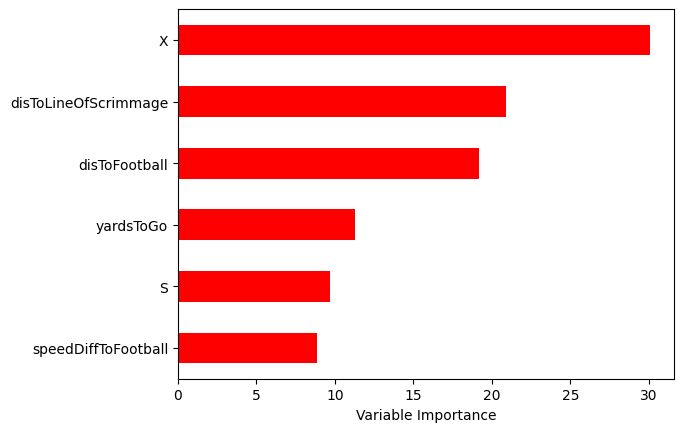

In [ ]:
Importance = pd.DataFrame({'Importance':CLF.best_estimator_.feature_importances_*100}, index=X_train.columns)
Importance.sort_values(by='Importance', axis=0, ascending=True).plot(kind='barh', color='r', )
plt.xlabel('Variable Importance')
plt.gca().legend_ = None

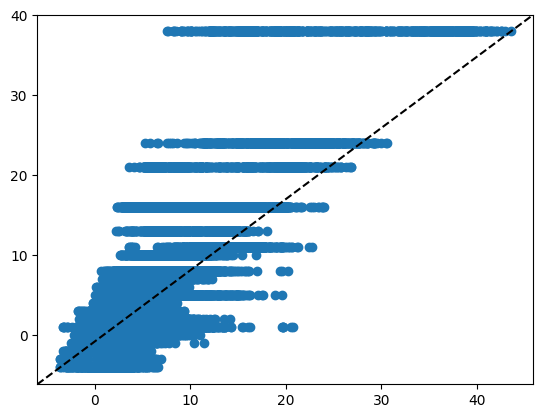

In [ ]:
plt.scatter(preds, y_train)
plt.plot([0, 1], [0, 1], '--k', transform=plt.gca().transAxes)

In [ ]:
# Used to create below chart which may gives a better picture as to how accurate we are on a play level rather than framae level
preds_df["Predictions"] = preds

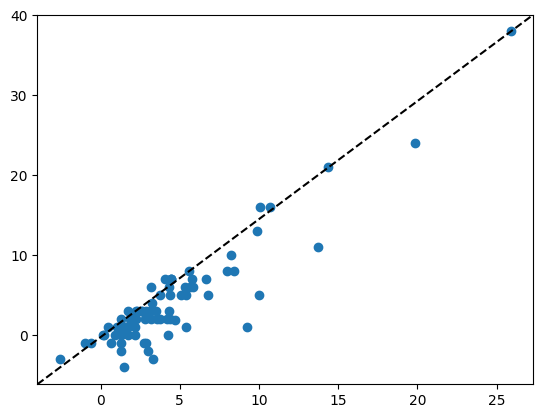

In [ ]:
plt.scatter(preds_df["Predictions"].groupby(preds_df["playId"]).mean(), y_train_preds["playResult"].groupby(preds_df["playId"]).mean())
plt.plot([0, 1], [0, 1], '--k', transform=plt.gca().transAxes)

# Visualizations / data saving

- Save predictions to create visualizations


In [ ]:
preds_df_summary = preds_df.groupby(['gameId', 'playId', 'frameId',"displayName"]).agg(
        Predictions = ('Predictions', 'first'),
        playResult = ('playResult',"mean"))

In [ ]:
preds_df_summary["Predictions average per play"] = preds_df.groupby(['gameId', 'playId','frameId']).agg(
        Predictions=('Predictions', 'mean'))

In [ ]:
file_path = "C:/Users/Ian_Pakka/Downloads/data.csv"
preds_df.to_csv(file_path, index = False)

',gameId,playId,frameId,club,displayName,X,Y,S,A,dis,O,playDirection,event,ballCarrierId,ballCarrierDisplayName,quarter,down,yardsToGo,possessionTeam,gameClock,playResult,playNullifiedByPenalty,offenseFormation,defendersInTheBox,absoluteYardlineNumber,SUCCESSFUL PALY (> 3 yards,x,y,s,disToFootball,speedDiffToFootball,disToLineOfScrimmage,Predictions\n0,2022101607.0,56.0,1.0,PIT,Alex Highsmith,-84.52,31.98,0.35,0.38,0.03,126.79,left,NoEvent,44816.0,Leonard Fournette,1.0,1.0,10.0,TB,15:00,1.0,N,SINGLEBACK,6.0,-85.0,0.0,-85.3000030517578,26.6700000762939,0.0,0.7800030517578023,0.35,0.480000000000004,4.273184510537405\n1,2022101607.0,56.0,1.0,PIT,Arthur Maulet,-83.11,19.04,0.38,0.37,0.03,99.96,left,NoEvent,44816.0,Leonard Fournette,1.0,1.0,10.0,TB,15:00,1.0,N,SINGLEBACK,6.0,-85.0,0.0,-85.3000030517578,26.6700000762939,0.0,2.190003051757799,0.38,1.8900000000000006,3.193252974671899\n2,2022101607.0,56.0,1.0,PIT,Cameron Heyward,-84.2,24.43,0.07,0.07,0.01,125.1,left,NoEvent,44816.0,Leonard Fou